In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose

In [3]:
preprocessed_energy_df = pd.read_csv('data/preprocessed_energy_dataset.csv')
column_names = preprocessed_energy_df.columns

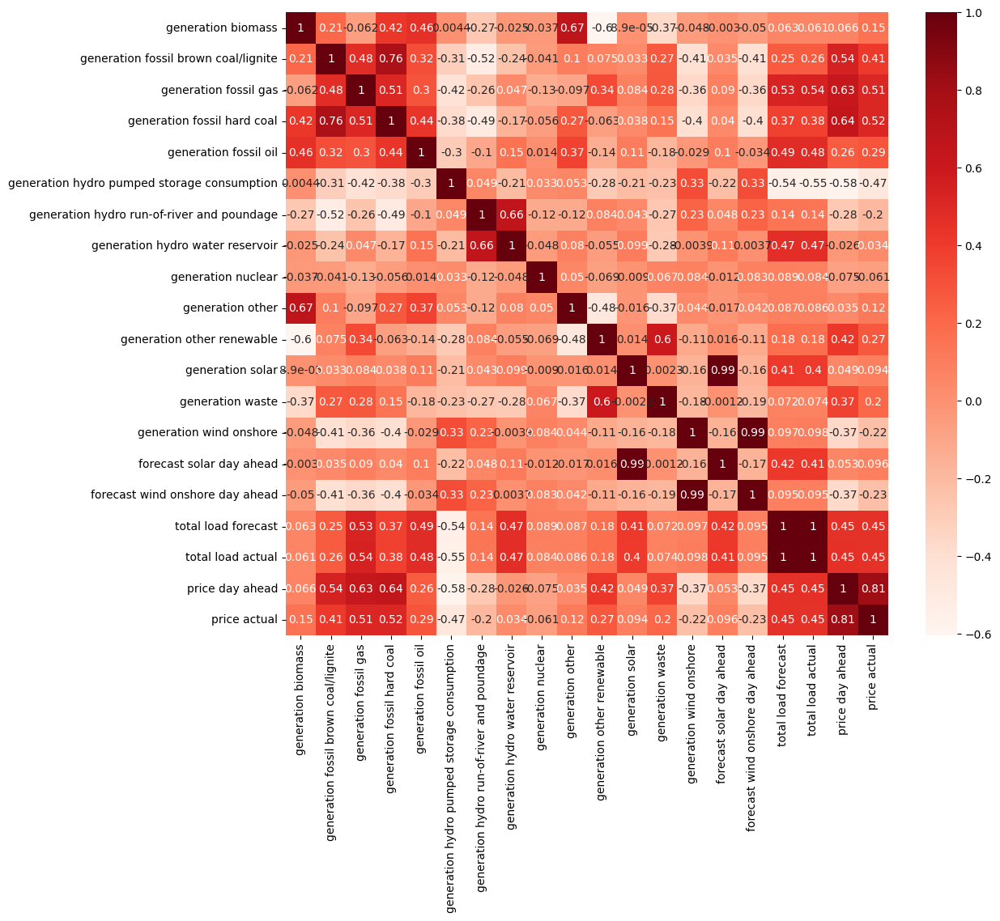

generation fossil brown coal/lignite           0.544089
generation fossil gas                          0.625122
generation fossil hard coal                    0.642111
generation hydro pumped storage consumption    0.584370
price day ahead                                1.000000
price actual                                   0.814836
Name: price day ahead, dtype: float64


In [48]:
preprocessed_energy_df = pd.read_csv('data/preprocessed_energy_dataset.csv')

X = preprocessed_energy_df.drop(['price day ahead'], axis=1)
y = preprocessed_energy_df['price day ahead']

# Pearson Correlation 
plt.figure(figsize=(12, 10))
cor = preprocessed_energy_df.corr(numeric_only=True)
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

#Correlation with output variable 
cor_target = abs(cor['price day ahead'])

#Selecting highly correlated features
relative_fetures = cor_target[cor_target>0.5]
print(relative_fetures) 


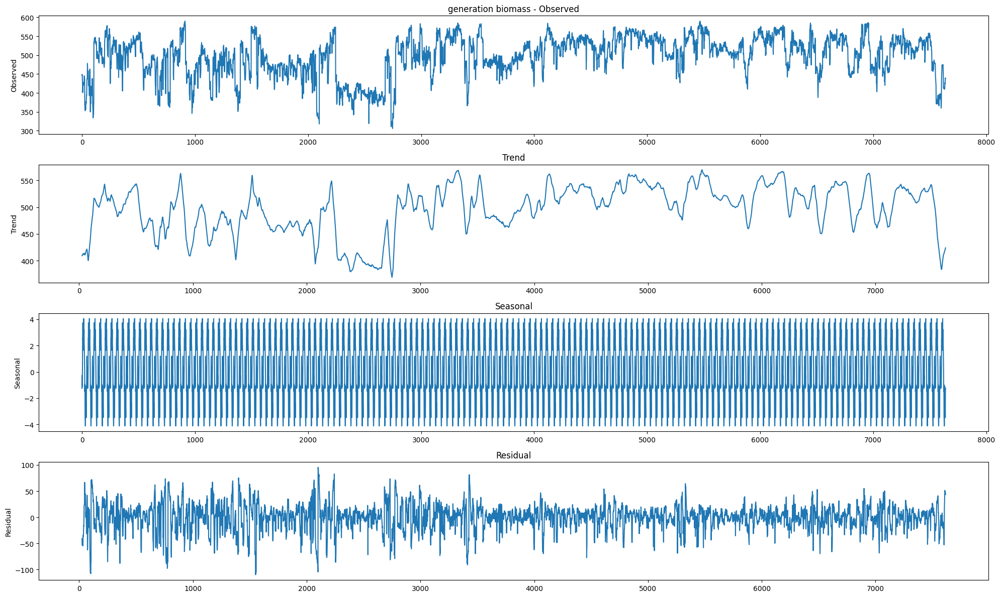

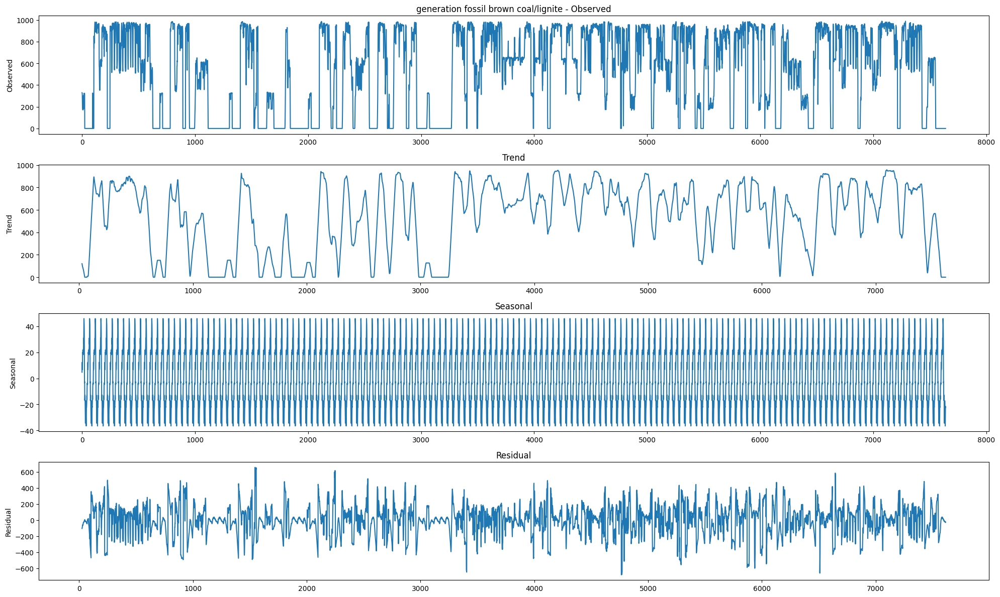

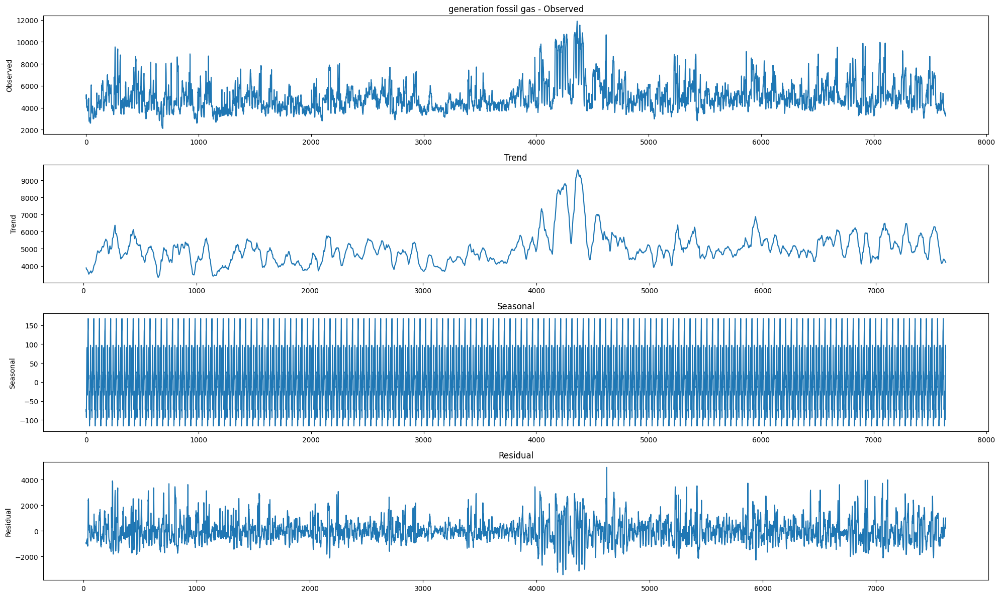

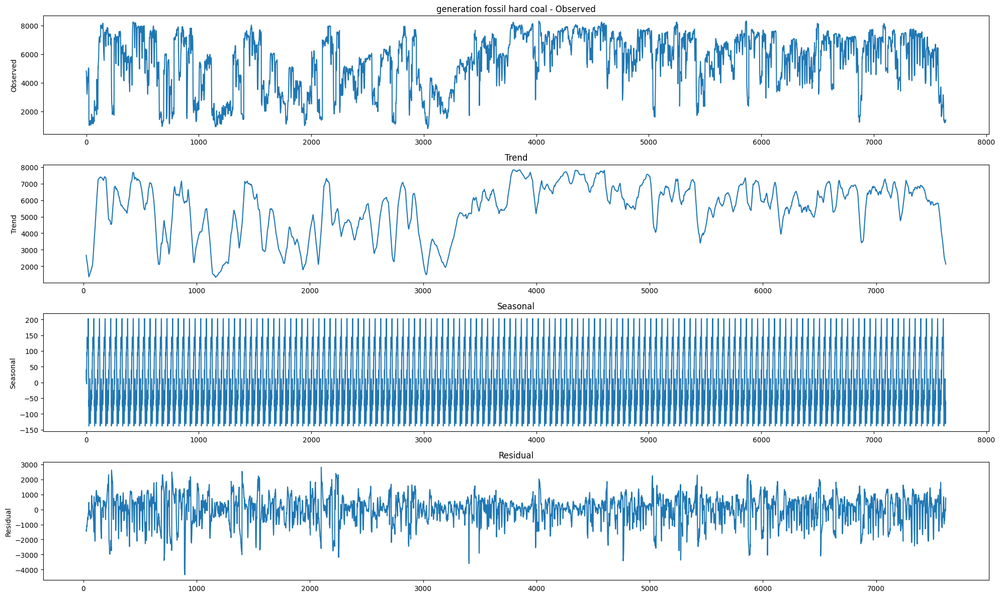

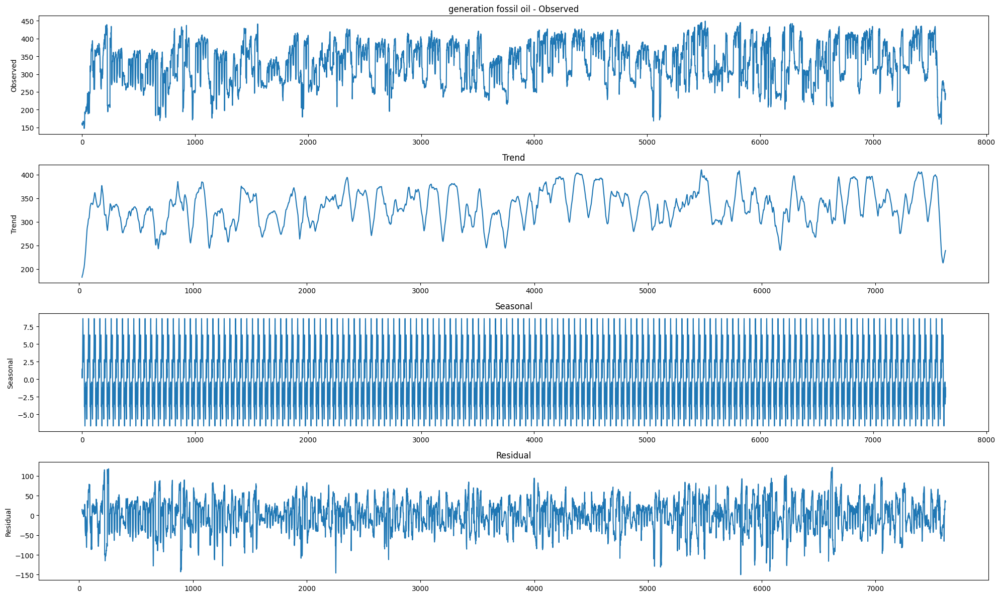

...

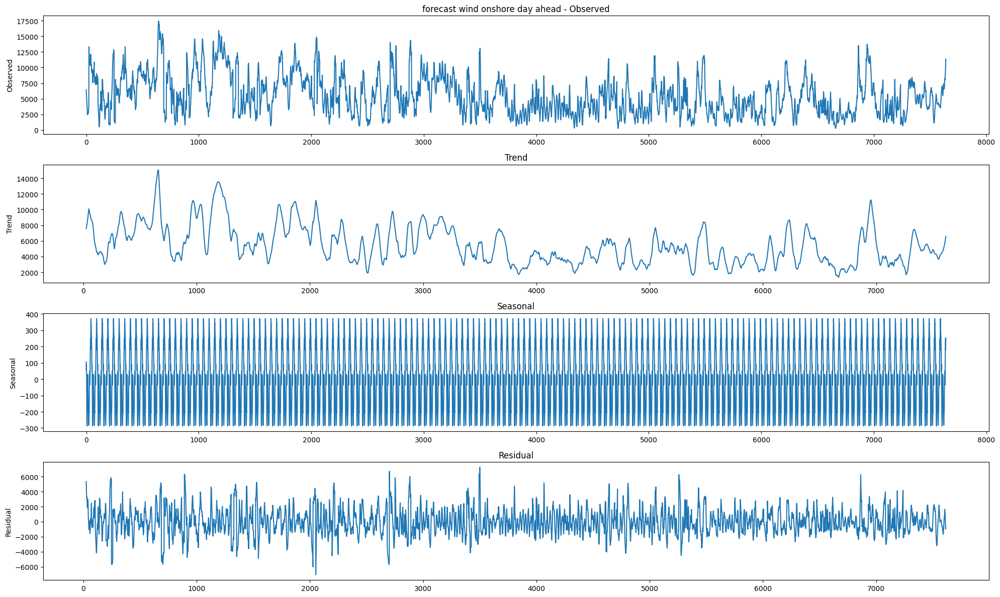

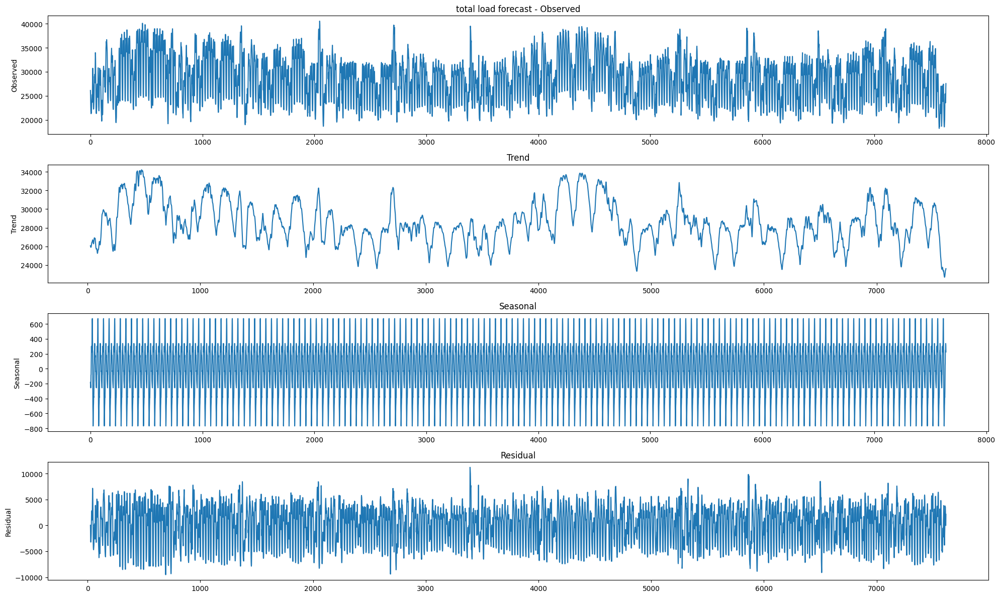

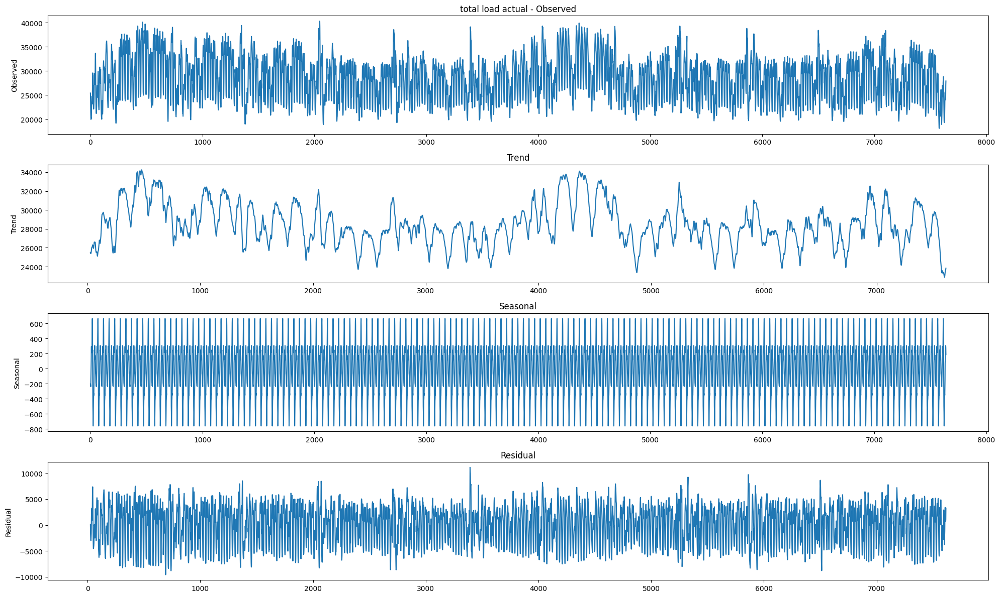

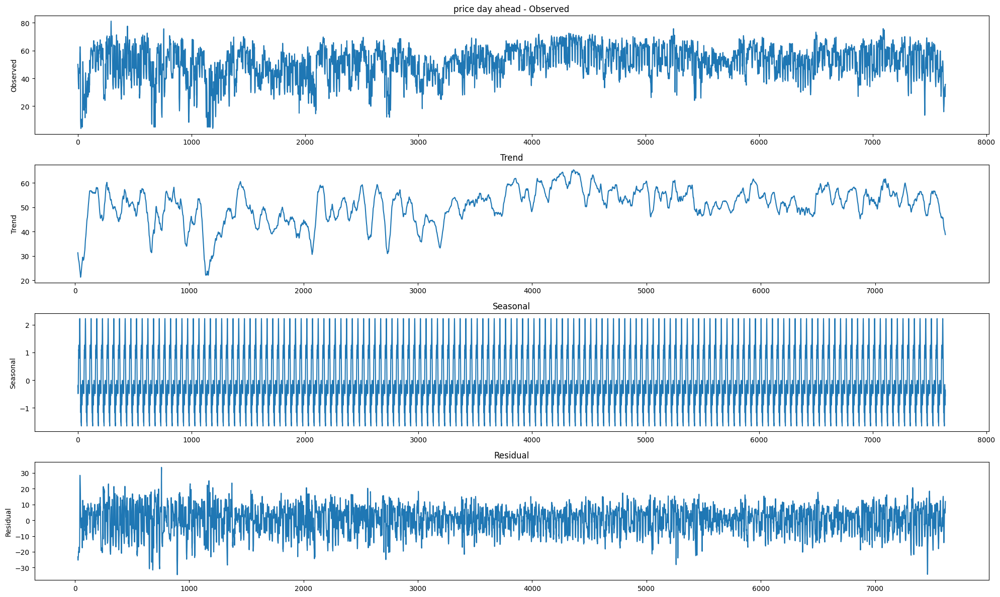

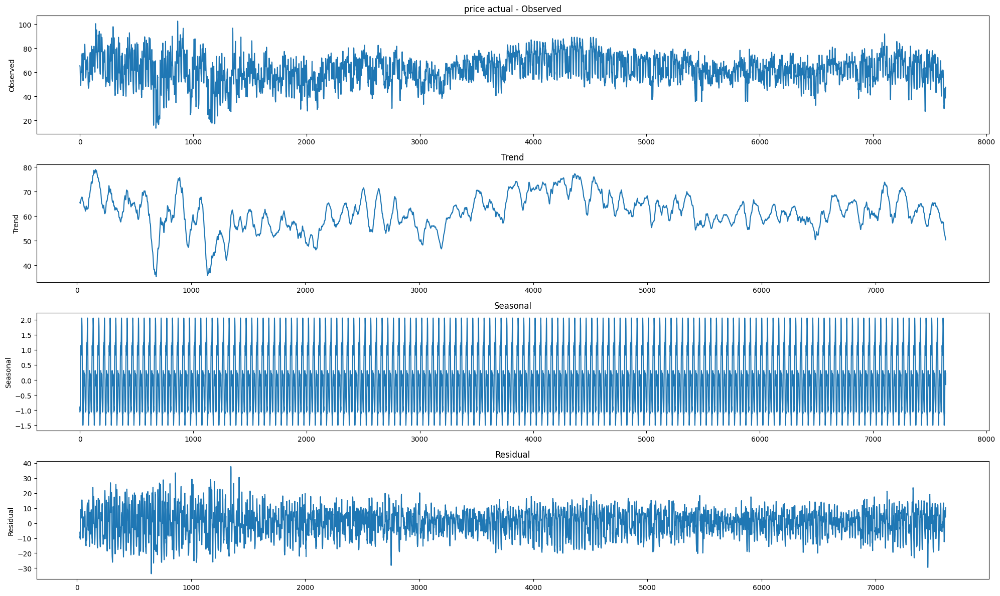

In [49]:
for column_name in column_names[1:]:
    result = seasonal_decompose(preprocessed_energy_df[column_name][:7641], model='additive', period=50)

    fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, figsize=(20, 12))
    result.observed.plot(ax=ax1, title=column_name + ' - Observed')
    ax1.set_ylabel('Observed')
    result.trend.plot(ax=ax2, title='Trend')
    ax2.set_ylabel('Trend')
    result.seasonal.plot(ax=ax3, title='Seasonal')
    ax3.set_ylabel('Seasonal')
    result.resid.plot(ax=ax4, title='Residual')
    ax4.set_ylabel('Residual')
    plt.tight_layout()
    plt.show()

In [4]:
import tsfel

# preprocessed_energy_df = preprocessed_energy_df.drop(['time'], axis=1)
cfg_file = tsfel.get_features_by_domain('statistical')
X_train = tsfel.time_series_features_extractor(cfg_file, preprocessed_energy_df, fs=50, window_size=250)

pd.DataFrame(X_train).to_csv('data/feature.csv', index=False)
df = pd.read_csv('data/feature.csv')

# main_directory = 'data/'
# output_directory = 'jalla/'

# data = tsfel.dataset_features_extractor(
#                     main_directory, cfg_file, search_criteria='preprocessed_energy_dataset.csv',
#                     time_unit=3600, resample_rate=100, window_size=250,
#                     output_directory=output_directory)

# for column_name in df.columns:
#     # plt.figure(figsize=(12, 10))
#     plt.title(column_name)
#     plt.plot(df[column_name])
#     plt.show()



*** Feature extraction started ***



*** Feature extraction finished ***


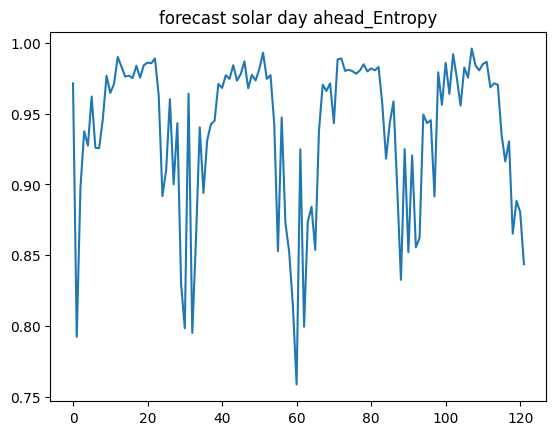

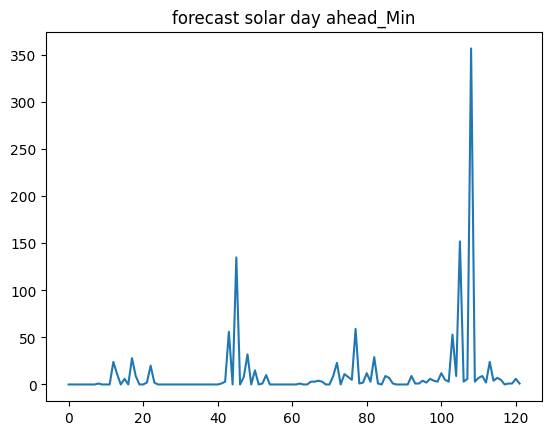

In [12]:
column_name = 'forecast solar day ahead_Entropy'
plt.title(column_name)
plt.plot(df[column_name])
plt.show()

column_name = 'forecast solar day ahead_Min'
plt.title(column_name)
plt.plot(df[column_name])
# plt.plot(df[column_name])
plt.show()